In [184]:
# pip install librosa

# Kelompok 3 Projek Akhir PSD
1. Bima Setia Sugiharto (24031554040)
2. Moh. Rasya Al Khalifi (24031554132)

# Library

In [122]:
import librosa
import librosa.display
import matplotlib.pyplot as plt
import IPython.display as ipd
import seaborn as sns
import numpy as np
import pandas as pd
import os

from sklearn.model_selection import train_test_split
from sklearn.neural_network import MLPClassifier
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import accuracy_score, classification_report, confusion_matrix

# Normal

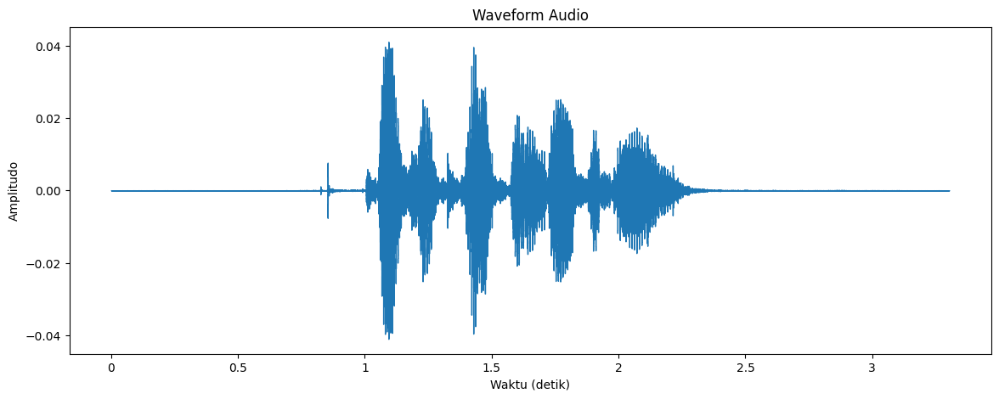

In [123]:
audio_path = '03-01-01-01-01-01-01.wav' # Normal
y, sr = librosa.load(audio_path)
ipd.display(ipd.Audio(y, rate=sr))

plt.figure(figsize=(14, 5))
librosa.display.waveshow(y, sr=sr)
plt.title('Waveform Audio')
plt.xlabel('Waktu (detik)')
plt.ylabel('Amplitudo')
plt.show()

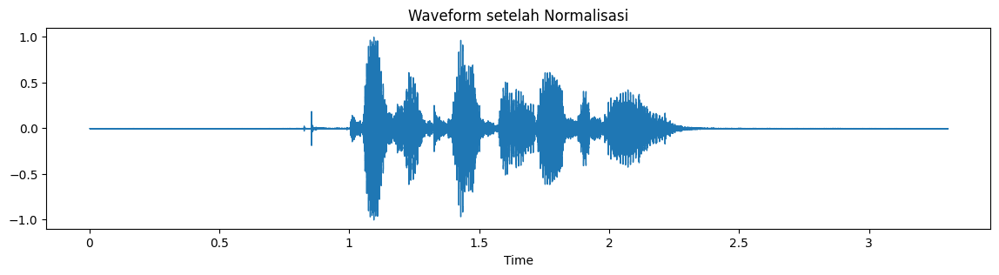

In [124]:
y_norm = y / np.max(np.abs(y)) # Biar amplitudonya konsisten
ipd.display(ipd.Audio(y_norm, rate=sr))

plt.figure(figsize=(14, 3))
librosa.display.waveshow(y_norm, sr=sr)
plt.title('Waveform setelah Normalisasi')
plt.show()

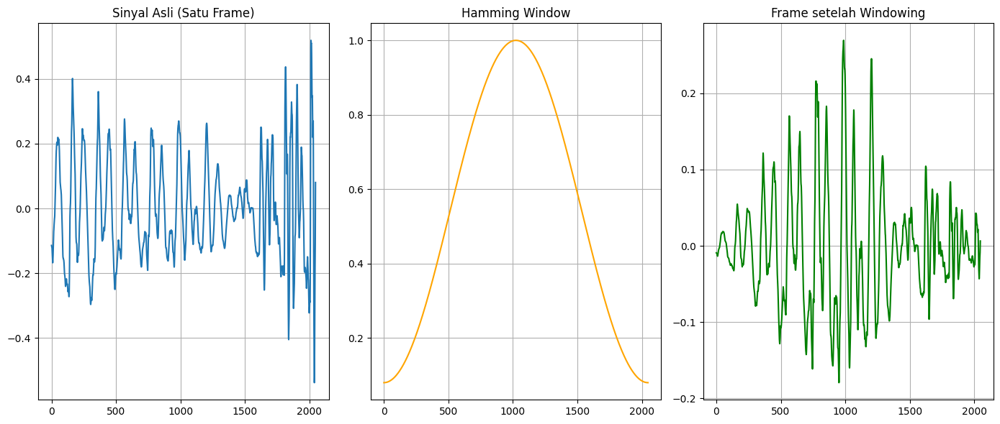

In [125]:
frame_size = 2048
hop_length = 512

center_sample = len(y_norm) // 2
frame = y_norm[center_sample : center_sample + frame_size]
window = np.hamming(frame_size)

frame_windowed = frame * window
frame_looped = np.tile(frame_windowed, 50)
ipd.display(ipd.Audio(frame_looped, rate=sr))

plt.figure(figsize=(14, 6))
plt.subplot(1, 3, 1)
plt.plot(frame)
plt.title('Sinyal Asli (Satu Frame)')
plt.grid()

plt.subplot(1, 3, 2)
plt.plot(window, color='orange')
plt.title('Hamming Window')
plt.grid()

plt.subplot(1, 3, 3)
plt.plot(frame_windowed, color='green')
plt.title('Frame setelah Windowing')
plt.grid()
plt.tight_layout()
plt.show()

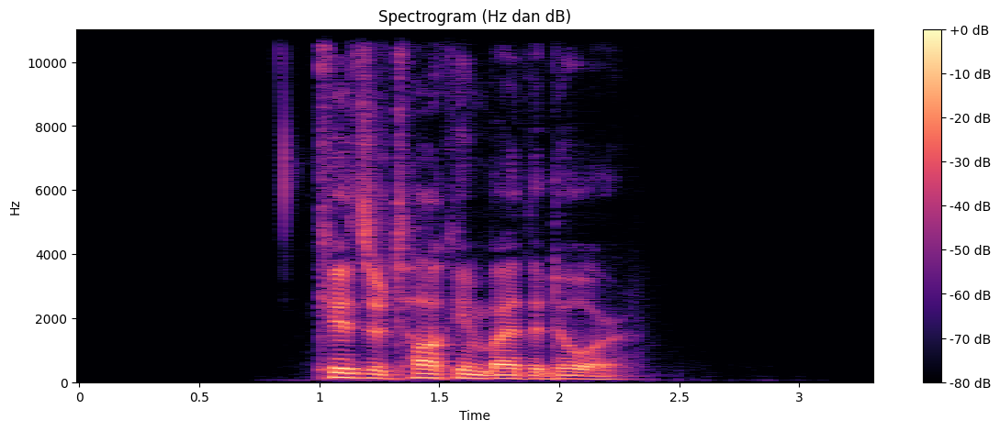

In [126]:
D = librosa.stft(y_norm)
S_db = librosa.amplitude_to_db(np.abs(D), ref=np.max)

plt.figure(figsize=(14, 5))
librosa.display.specshow(S_db, sr=sr, x_axis='time', y_axis='hz')
plt.colorbar(format='%+2.0f dB')
plt.title('Spectrogram (Hz dan dB)')
plt.show()

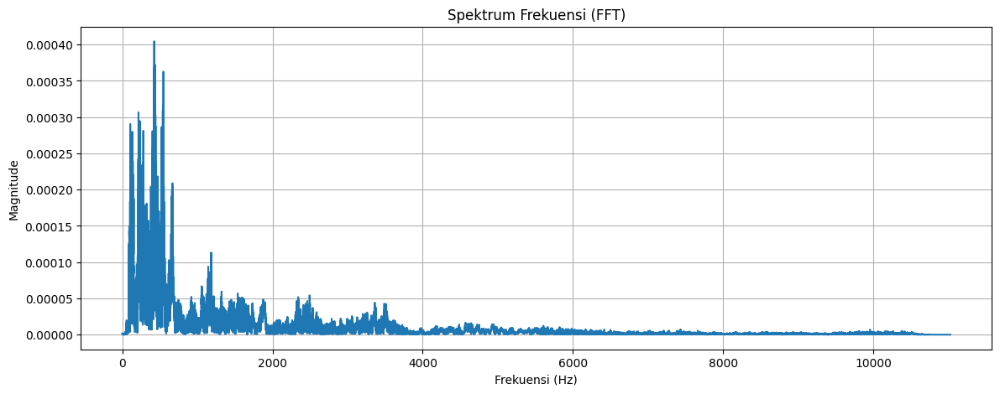

In [127]:
from scipy.fft import fft, fftfreq
N = len(y)
yf = fft(y)
xf = fftfreq(N, 1 / sr)

plt.figure(figsize=(14, 5))
plt.plot(xf[:N//2], 2.0/N * np.abs(yf[:N//2]))
plt.title('Spektrum Frekuensi (FFT)')
plt.xlabel('Frekuensi (Hz)')
plt.ylabel('Magnitude')
plt.grid()
plt.show()

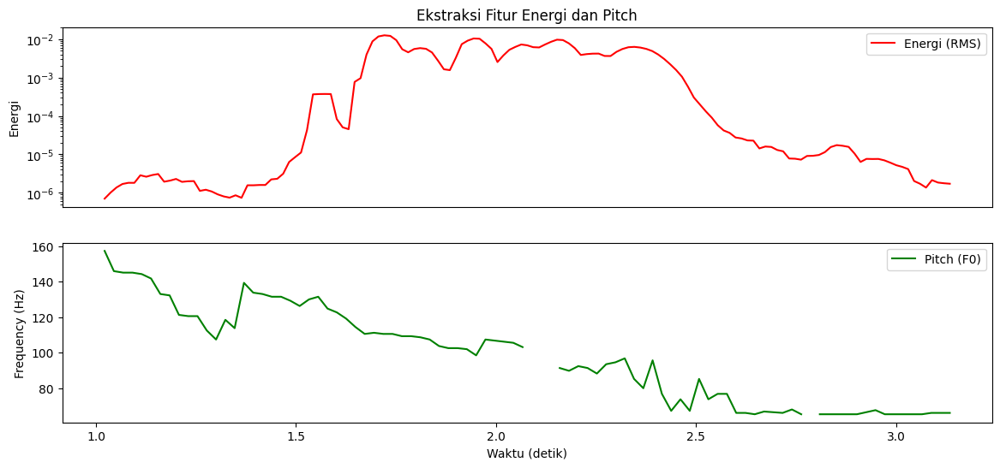

Rata-rata Pitch: 98.43 Hz
Rata-rata Energi: 0.0023


In [128]:
f0, voiced_flag, voiced_probs = librosa.pyin(y, fmin=librosa.note_to_hz('C2'), fmax=librosa.note_to_hz('C7'))
rms = librosa.feature.rms(y=y)
times = librosa.times_like(rms)

plt.figure(figsize=(14, 6))

plt.subplot(2, 1, 1)
plt.semilogy(times, rms[0], label='Energi (RMS)', color='r')
plt.ylabel('Energi')
plt.xticks([])
plt.legend()
plt.title('Ekstraksi Fitur Energi dan Pitch')

plt.subplot(2, 1, 2)
plt.plot(times, f0, label='Pitch (F0)', color='g')
plt.ylabel('Frequency (Hz)')
plt.xlabel('Waktu (detik)')
plt.legend()
plt.show()

print(f"Rata-rata Pitch: {np.nanmean(f0):.2f} Hz")
print(f"Rata-rata Energi: {np.mean(rms):.4f}")

# Santai

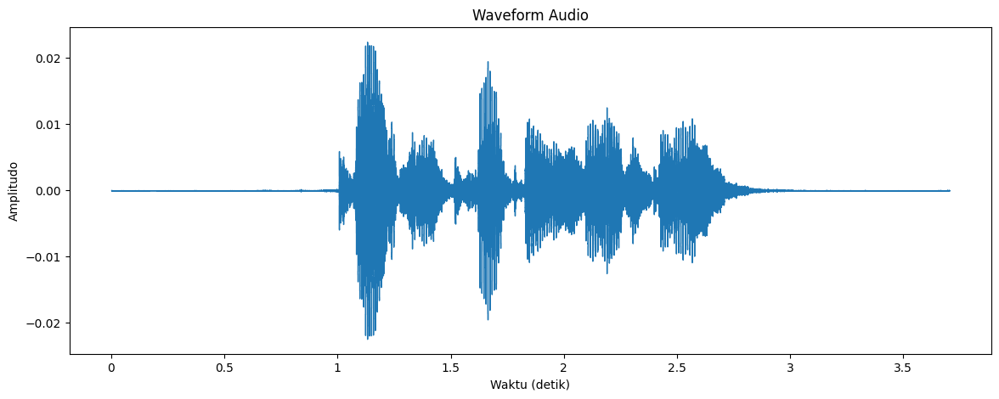

In [129]:
audio_path2 = '03-01-02-02-01-01-01.wav' # Santai
y, sr = librosa.load(audio_path2)
ipd.display(ipd.Audio(y, rate=sr))

plt.figure(figsize=(14, 5))
librosa.display.waveshow(y, sr=sr)
plt.title('Waveform Audio')
plt.xlabel('Waktu (detik)')
plt.ylabel('Amplitudo')
plt.show()

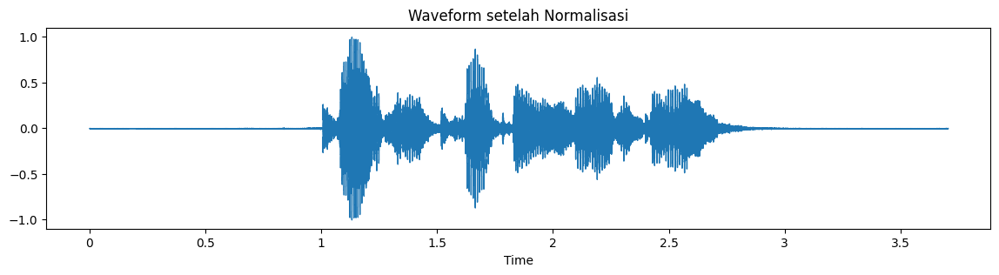

In [130]:
y_norm = y / np.max(np.abs(y)) # Biar amplitudonya konsisten
ipd.display(ipd.Audio(y_norm, rate=sr))

plt.figure(figsize=(14, 3))
librosa.display.waveshow(y_norm, sr=sr)
plt.title('Waveform setelah Normalisasi')
plt.show()

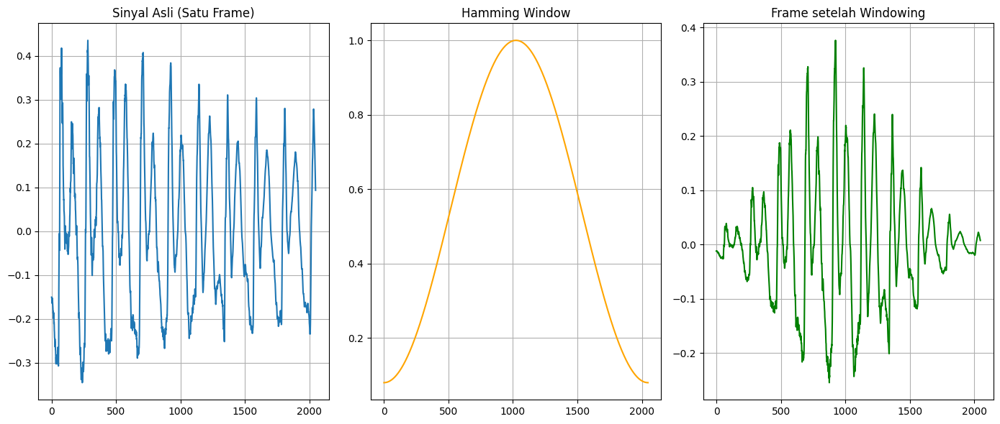

In [131]:
frame_size = 2048
hop_length = 512

center_sample = len(y_norm) // 2
frame = y_norm[center_sample : center_sample + frame_size]
window = np.hamming(frame_size)

frame_windowed = frame * window
frame_looped = np.tile(frame_windowed, 50)
ipd.display(ipd.Audio(frame_looped, rate=sr))

plt.figure(figsize=(14, 6))
plt.subplot(1, 3, 1)
plt.plot(frame)
plt.title('Sinyal Asli (Satu Frame)')
plt.grid()

plt.subplot(1, 3, 2)
plt.plot(window, color='orange')
plt.title('Hamming Window')
plt.grid()

plt.subplot(1, 3, 3)
plt.plot(frame_windowed, color='green')
plt.title('Frame setelah Windowing')
plt.grid()
plt.tight_layout()
plt.show()

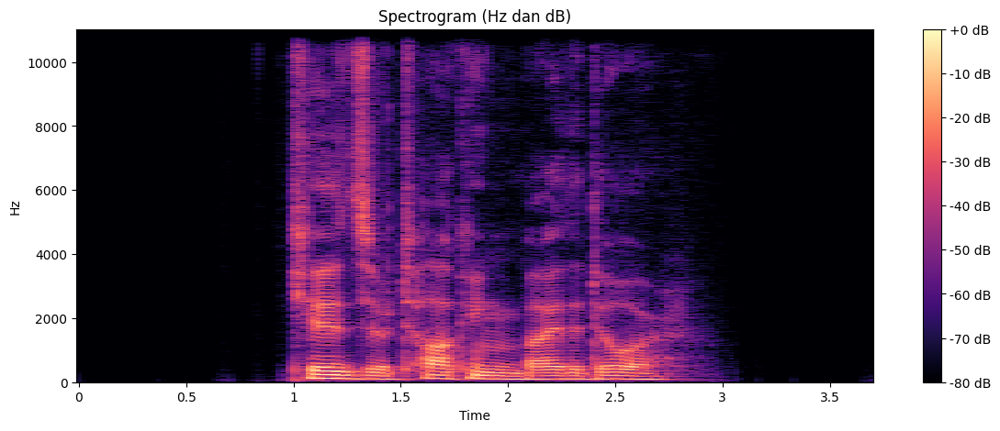

In [132]:
D = librosa.stft(y_norm)
S_db = librosa.amplitude_to_db(np.abs(D), ref=np.max)

plt.figure(figsize=(14, 5))
librosa.display.specshow(S_db, sr=sr, x_axis='time', y_axis='hz')
plt.colorbar(format='%+2.0f dB')
plt.title('Spectrogram (Hz dan dB)')
plt.show()

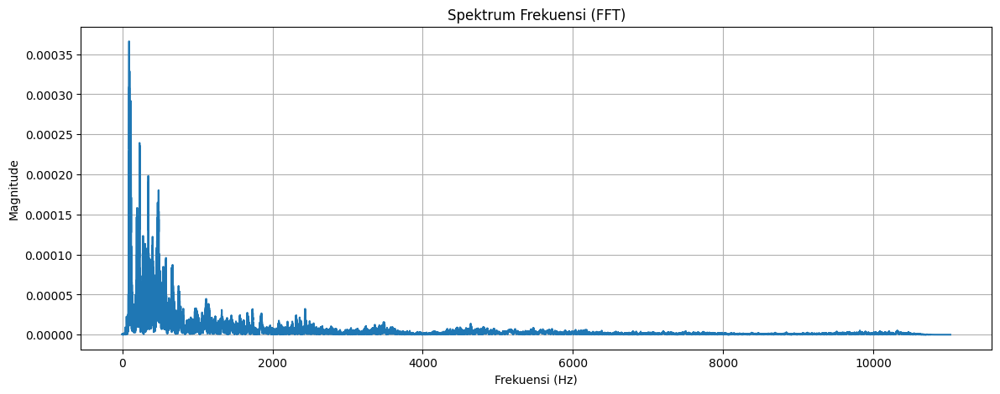

In [133]:
from scipy.fft import fft, fftfreq
N = len(y)
yf = fft(y)
xf = fftfreq(N, 1 / sr)

plt.figure(figsize=(14, 5))
plt.plot(xf[:N//2], 2.0/N * np.abs(yf[:N//2]))
plt.title('Spektrum Frekuensi (FFT)')
plt.xlabel('Frekuensi (Hz)')
plt.ylabel('Magnitude')
plt.grid()
plt.show()

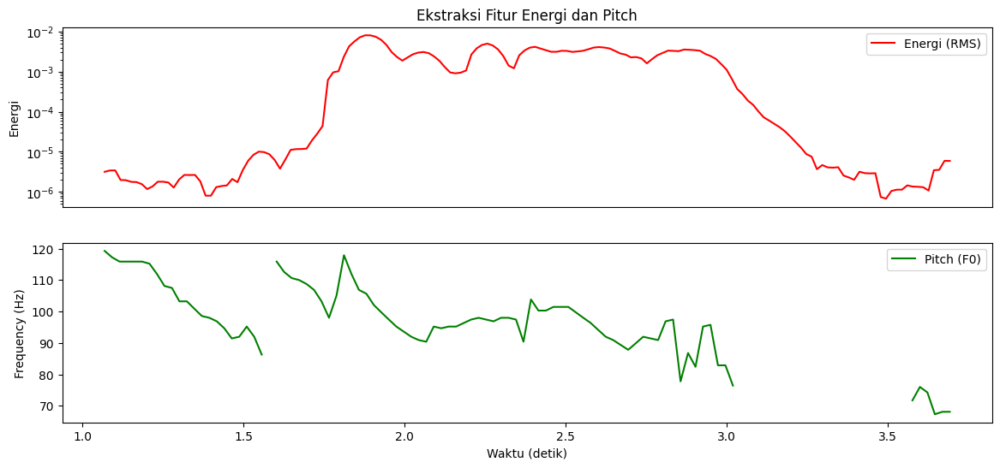

Rata-rata Pitch: 97.12 Hz
Rata-rata Energi: 0.0015


In [134]:
f0, voiced_flag, voiced_probs = librosa.pyin(y, fmin=librosa.note_to_hz('C2'), fmax=librosa.note_to_hz('C7'))
rms = librosa.feature.rms(y=y)
times = librosa.times_like(rms)

plt.figure(figsize=(14, 6))

plt.subplot(2, 1, 1)
plt.semilogy(times, rms[0], label='Energi (RMS)', color='r')
plt.ylabel('Energi')
plt.xticks([])
plt.legend()
plt.title('Ekstraksi Fitur Energi dan Pitch')

plt.subplot(2, 1, 2)
plt.plot(times, f0, label='Pitch (F0)', color='g')
plt.ylabel('Frequency (Hz)')
plt.xlabel('Waktu (detik)')
plt.legend()
plt.show()

print(f"Rata-rata Pitch: {np.nanmean(f0):.2f} Hz")
print(f"Rata-rata Energi: {np.mean(rms):.4f}")

# Senang

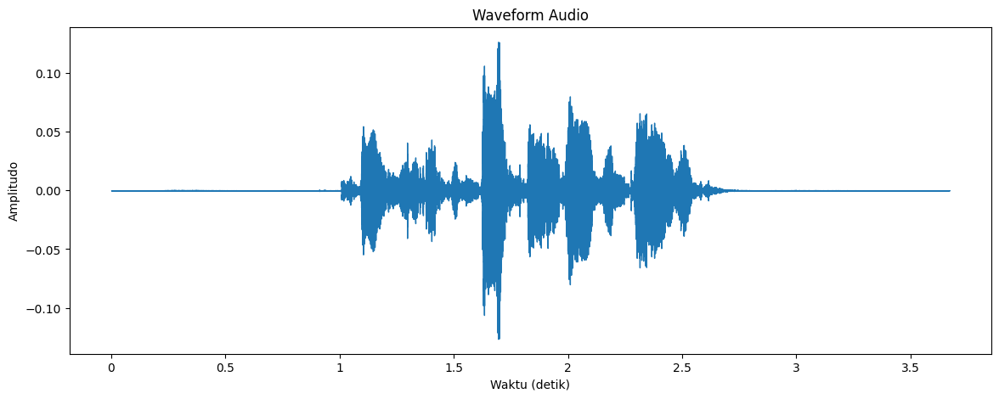

In [135]:
audio_path3 = '03-01-03-02-01-01-01.wav' #Senang
y, sr = librosa.load(audio_path3)
ipd.display(ipd.Audio(y, rate=sr))

plt.figure(figsize=(14, 5))
librosa.display.waveshow(y, sr=sr)
plt.title('Waveform Audio')
plt.xlabel('Waktu (detik)')
plt.ylabel('Amplitudo')
plt.show()

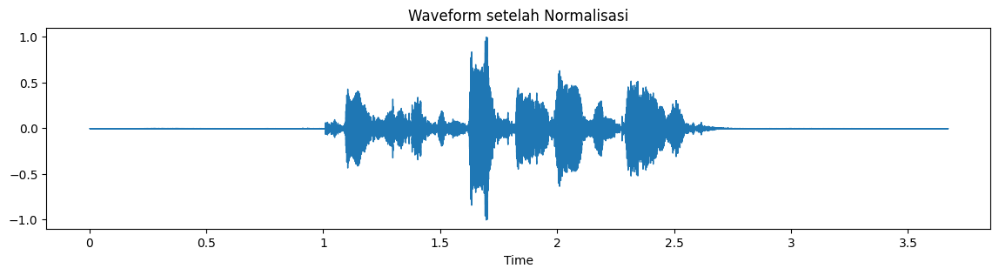

In [136]:
y_norm = y / np.max(np.abs(y)) # Biar amplitudonya konsisten
ipd.display(ipd.Audio(y_norm, rate=sr))

plt.figure(figsize=(14, 3))
librosa.display.waveshow(y_norm, sr=sr)
plt.title('Waveform setelah Normalisasi')
plt.show()

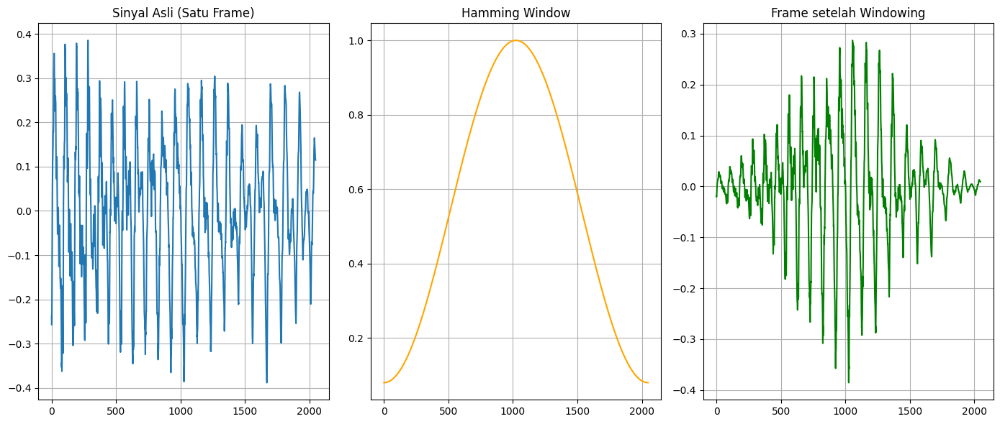

In [137]:
frame_size = 2048
hop_length = 512

center_sample = len(y_norm) // 2
frame = y_norm[center_sample : center_sample + frame_size]
window = np.hamming(frame_size)

frame_windowed = frame * window
frame_looped = np.tile(frame_windowed, 50)
ipd.display(ipd.Audio(frame_looped, rate=sr))

plt.figure(figsize=(14, 6))
plt.subplot(1, 3, 1)
plt.plot(frame)
plt.title('Sinyal Asli (Satu Frame)')
plt.grid()

plt.subplot(1, 3, 2)
plt.plot(window, color='orange')
plt.title('Hamming Window')
plt.grid()

plt.subplot(1, 3, 3)
plt.plot(frame_windowed, color='green')
plt.title('Frame setelah Windowing')
plt.grid()
plt.tight_layout()
plt.show()

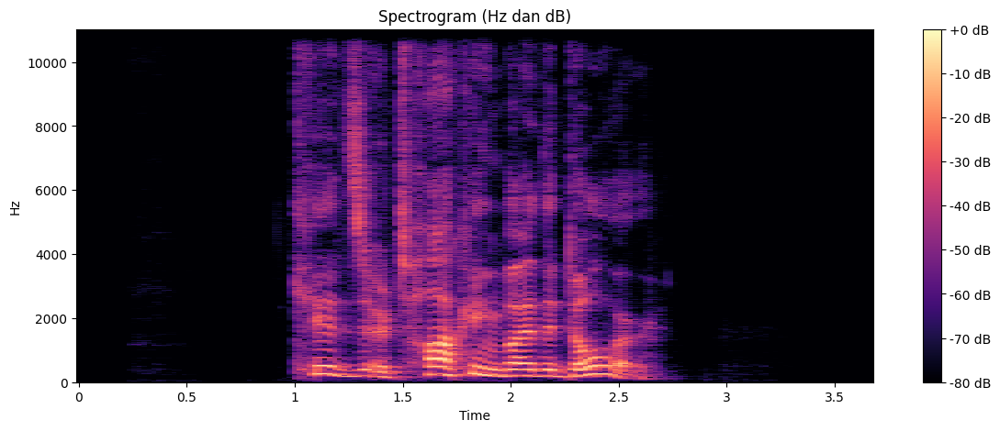

In [138]:
D = librosa.stft(y_norm)
S_db = librosa.amplitude_to_db(np.abs(D), ref=np.max)

plt.figure(figsize=(14, 5))
librosa.display.specshow(S_db, sr=sr, x_axis='time', y_axis='hz')
plt.colorbar(format='%+2.0f dB')
plt.title('Spectrogram (Hz dan dB)')
plt.show()

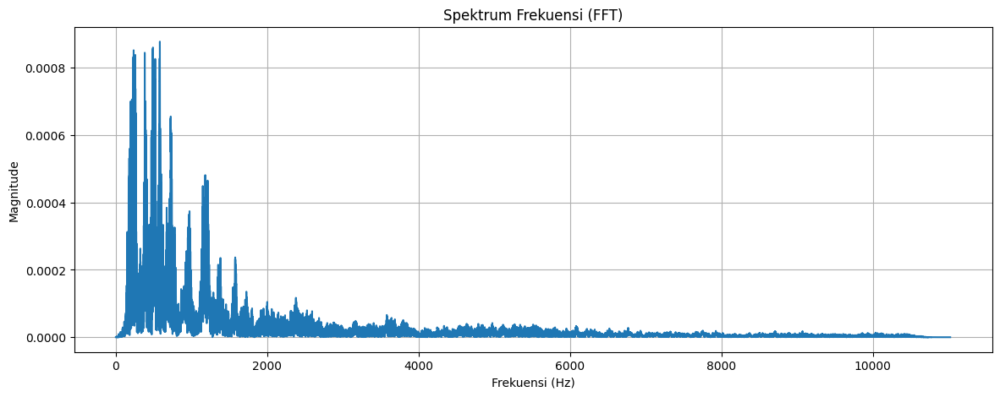

In [139]:
from scipy.fft import fft, fftfreq
N = len(y)
yf = fft(y)
xf = fftfreq(N, 1 / sr)

plt.figure(figsize=(14, 5))
plt.plot(xf[:N//2], 2.0/N * np.abs(yf[:N//2]))
plt.title('Spektrum Frekuensi (FFT)')
plt.xlabel('Frekuensi (Hz)')
plt.ylabel('Magnitude')
plt.grid()
plt.show()

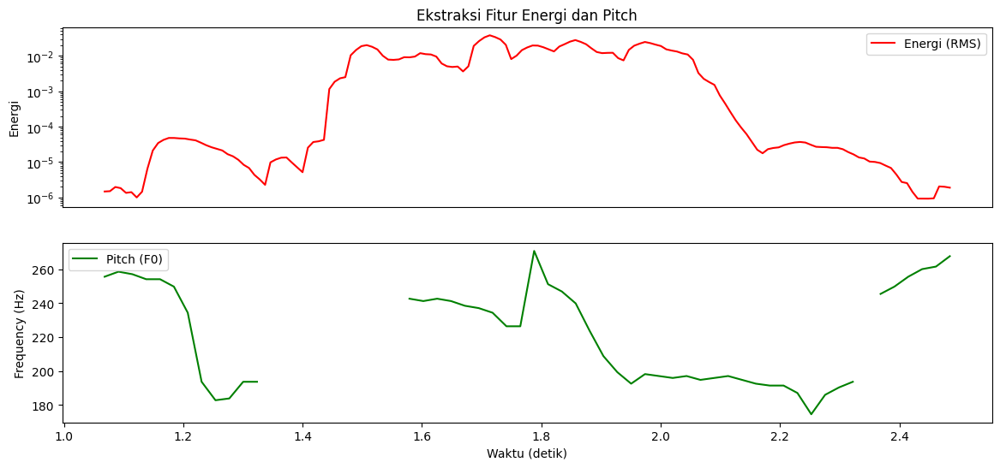

Rata-rata Pitch: 221.50 Hz
Rata-rata Energi: 0.0064


In [140]:
f0, voiced_flag, voiced_probs = librosa.pyin(y, fmin=librosa.note_to_hz('C2'), fmax=librosa.note_to_hz('C7'))
rms = librosa.feature.rms(y=y)
times = librosa.times_like(rms)

plt.figure(figsize=(14, 6))

plt.subplot(2, 1, 1)
plt.semilogy(times, rms[0], label='Energi (RMS)', color='r')
plt.ylabel('Energi')
plt.xticks([])
plt.legend()
plt.title('Ekstraksi Fitur Energi dan Pitch')

plt.subplot(2, 1, 2)
plt.plot(times, f0, label='Pitch (F0)', color='g')
plt.ylabel('Frequency (Hz)')
plt.xlabel('Waktu (detik)')
plt.legend()
plt.show()

print(f"Rata-rata Pitch: {np.nanmean(f0):.2f} Hz")
print(f"Rata-rata Energi: {np.mean(rms):.4f}")

# Sedih

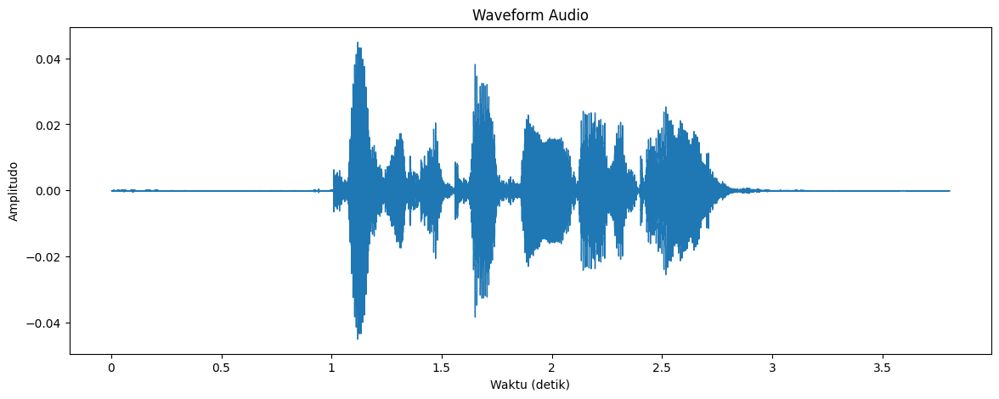

In [141]:
audio_path4 = '03-01-04-02-01-01-01.wav' #Sedih
y, sr = librosa.load(audio_path4)
ipd.display(ipd.Audio(y, rate=sr))

plt.figure(figsize=(14, 5))
librosa.display.waveshow(y, sr=sr)
plt.title('Waveform Audio')
plt.xlabel('Waktu (detik)')
plt.ylabel('Amplitudo')
plt.show()

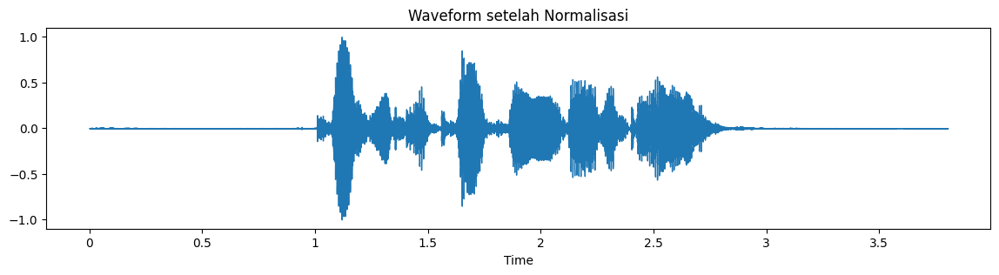

In [142]:
y_norm = y / np.max(np.abs(y)) # Biar amplitudonya konsisten
ipd.display(ipd.Audio(y_norm, rate=sr))

plt.figure(figsize=(14, 3))
librosa.display.waveshow(y_norm, sr=sr)
plt.title('Waveform setelah Normalisasi')
plt.show()

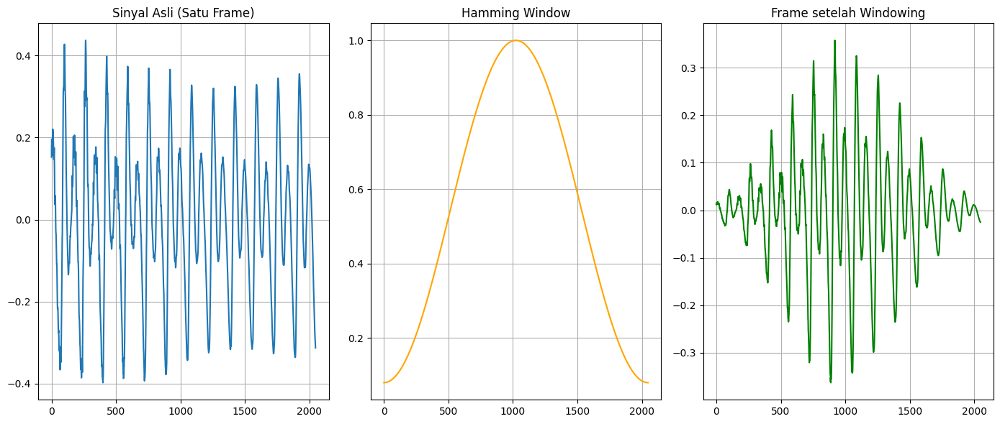

In [143]:
frame_size = 2048
hop_length = 512

center_sample = len(y_norm) // 2
frame = y_norm[center_sample : center_sample + frame_size]
window = np.hamming(frame_size)

frame_windowed = frame * window
frame_looped = np.tile(frame_windowed, 50)
ipd.display(ipd.Audio(frame_looped, rate=sr))

plt.figure(figsize=(14, 6))
plt.subplot(1, 3, 1)
plt.plot(frame)
plt.title('Sinyal Asli (Satu Frame)')
plt.grid()

plt.subplot(1, 3, 2)
plt.plot(window, color='orange')
plt.title('Hamming Window')
plt.grid()

plt.subplot(1, 3, 3)
plt.plot(frame_windowed, color='green')
plt.title('Frame setelah Windowing')
plt.grid()
plt.tight_layout()
plt.show()

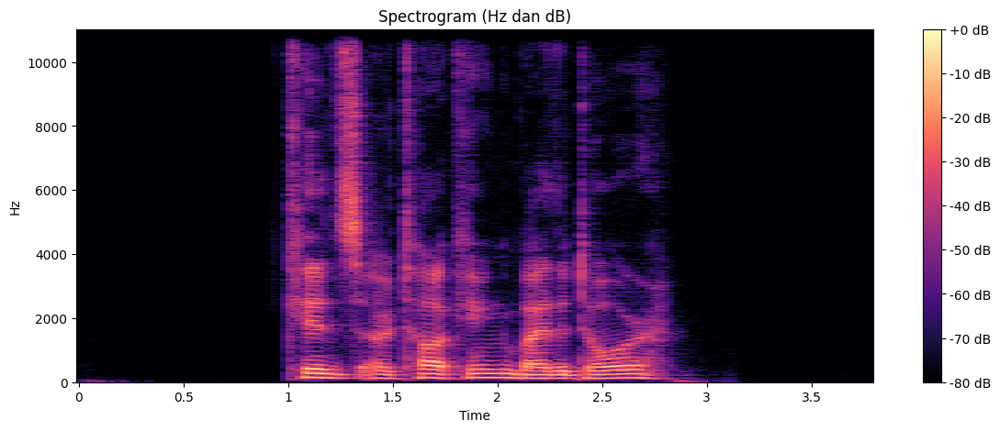

In [144]:
D = librosa.stft(y_norm)
S_db = librosa.amplitude_to_db(np.abs(D), ref=np.max)

plt.figure(figsize=(14, 5))
librosa.display.specshow(S_db, sr=sr, x_axis='time', y_axis='hz')
plt.colorbar(format='%+2.0f dB')
plt.title('Spectrogram (Hz dan dB)')
plt.show()

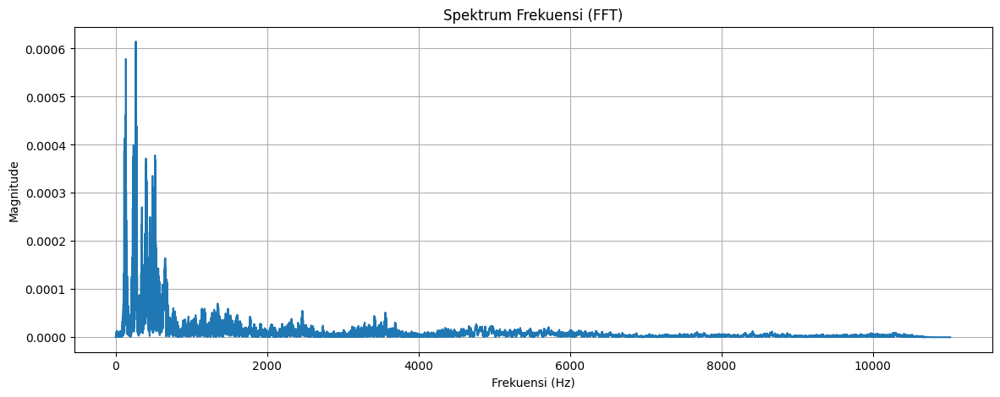

In [145]:
from scipy.fft import fft, fftfreq
N = len(y)
yf = fft(y)
xf = fftfreq(N, 1 / sr)

plt.figure(figsize=(14, 5))
plt.plot(xf[:N//2], 2.0/N * np.abs(yf[:N//2]))
plt.title('Spektrum Frekuensi (FFT)')
plt.xlabel('Frekuensi (Hz)')
plt.ylabel('Magnitude')
plt.grid()
plt.show()

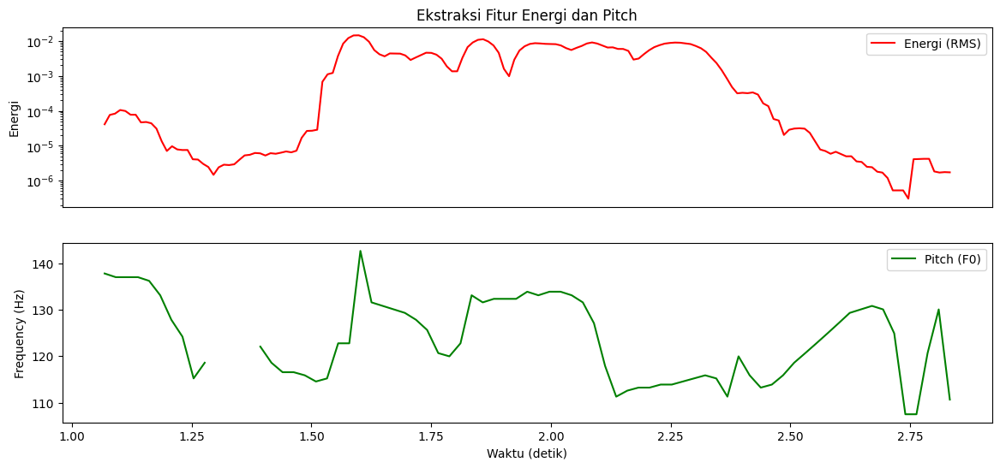

Rata-rata Pitch: 123.57 Hz
Rata-rata Energi: 0.0029


In [146]:
f0, voiced_flag, voiced_probs = librosa.pyin(y, fmin=librosa.note_to_hz('C2'), fmax=librosa.note_to_hz('C7'))
rms = librosa.feature.rms(y=y)
times = librosa.times_like(rms)

plt.figure(figsize=(14, 6))

plt.subplot(2, 1, 1)
plt.semilogy(times, rms[0], label='Energi (RMS)', color='r')
plt.ylabel('Energi')
plt.xticks([])
plt.legend()
plt.title('Ekstraksi Fitur Energi dan Pitch')

plt.subplot(2, 1, 2)
plt.plot(times, f0, label='Pitch (F0)', color='g')
plt.ylabel('Frequency (Hz)')
plt.xlabel('Waktu (detik)')
plt.legend()
plt.show()

print(f"Rata-rata Pitch: {np.nanmean(f0):.2f} Hz")
print(f"Rata-rata Energi: {np.mean(rms):.4f}")

# Marah

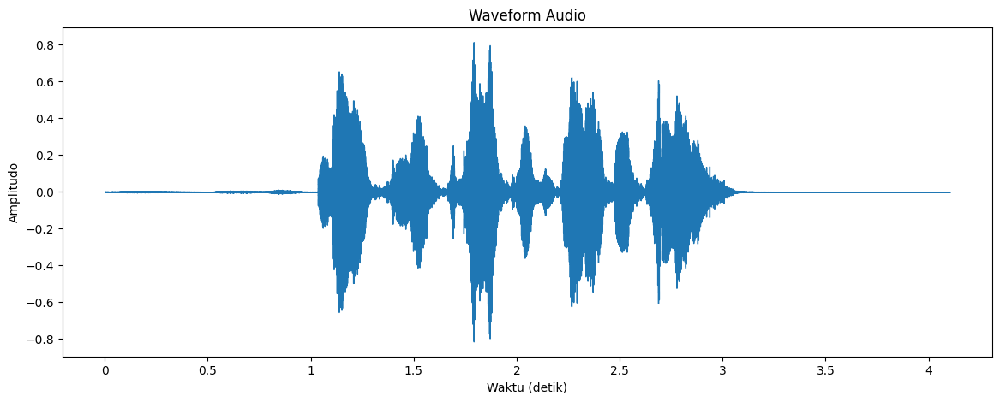

In [147]:
audio_path5 = '03-01-05-02-01-01-01.wav' #Marah
y, sr = librosa.load(audio_path5)
ipd.display(ipd.Audio(y, rate=sr))

plt.figure(figsize=(14, 5))
librosa.display.waveshow(y, sr=sr)
plt.title('Waveform Audio')
plt.xlabel('Waktu (detik)')
plt.ylabel('Amplitudo')
plt.show()

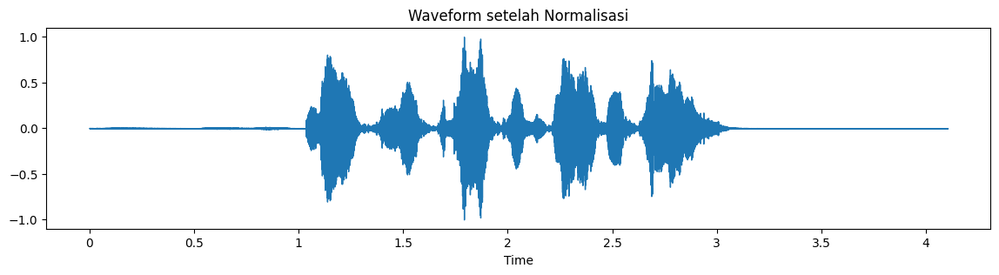

In [148]:
y_norm = y / np.max(np.abs(y)) # Biar amplitudonya konsisten
ipd.display(ipd.Audio(y_norm, rate=sr))

plt.figure(figsize=(14, 3))
librosa.display.waveshow(y_norm, sr=sr)
plt.title('Waveform setelah Normalisasi')
plt.show()

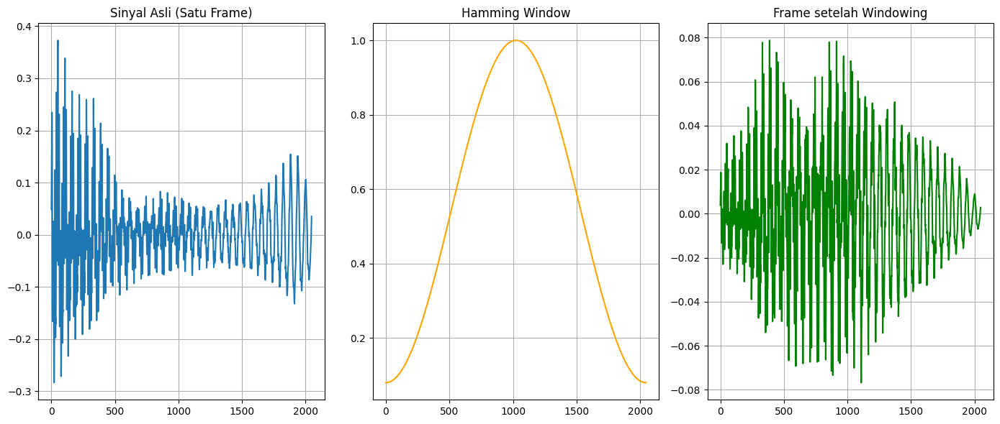

In [149]:
frame_size = 2048
hop_length = 512

center_sample = len(y_norm) // 2
frame = y_norm[center_sample : center_sample + frame_size]
window = np.hamming(frame_size)

frame_windowed = frame * window
frame_looped = np.tile(frame_windowed, 50)
ipd.display(ipd.Audio(frame_looped, rate=sr))

plt.figure(figsize=(14, 6))
plt.subplot(1, 3, 1)
plt.plot(frame)
plt.title('Sinyal Asli (Satu Frame)')
plt.grid()

plt.subplot(1, 3, 2)
plt.plot(window, color='orange')
plt.title('Hamming Window')
plt.grid()

plt.subplot(1, 3, 3)
plt.plot(frame_windowed, color='green')
plt.title('Frame setelah Windowing')
plt.grid()
plt.tight_layout()
plt.show()

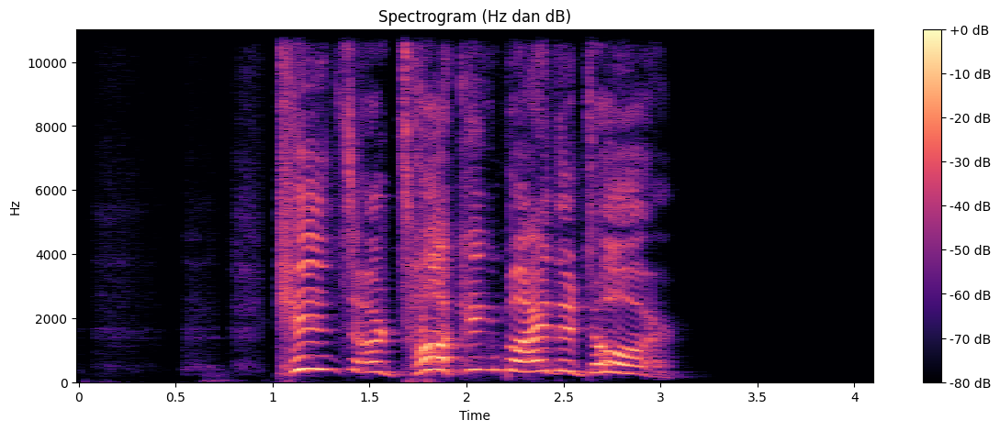

In [150]:
D = librosa.stft(y_norm)
S_db = librosa.amplitude_to_db(np.abs(D), ref=np.max)

plt.figure(figsize=(14, 5))
librosa.display.specshow(S_db, sr=sr, x_axis='time', y_axis='hz')
plt.colorbar(format='%+2.0f dB')
plt.title('Spectrogram (Hz dan dB)')
plt.show()

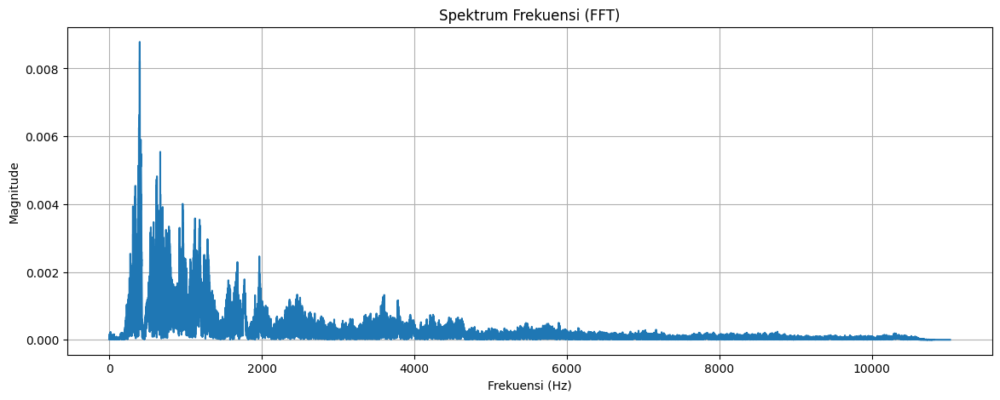

In [151]:
from scipy.fft import fft, fftfreq
N = len(y)
yf = fft(y)
xf = fftfreq(N, 1 / sr)

plt.figure(figsize=(14, 5))
plt.plot(xf[:N//2], 2.0/N * np.abs(yf[:N//2]))
plt.title('Spektrum Frekuensi (FFT)')
plt.xlabel('Frekuensi (Hz)')
plt.ylabel('Magnitude')
plt.grid()
plt.show()

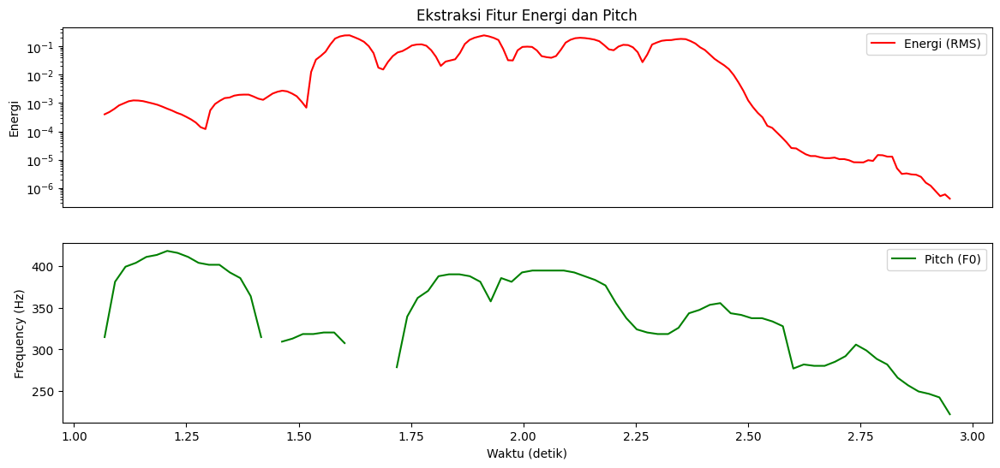

Rata-rata Pitch: 343.20 Hz
Rata-rata Energi: 0.0537


In [152]:
f0, voiced_flag, voiced_probs = librosa.pyin(y, fmin=librosa.note_to_hz('C2'), fmax=librosa.note_to_hz('C7'))
rms = librosa.feature.rms(y=y)
times = librosa.times_like(rms)

plt.figure(figsize=(14, 6))

plt.subplot(2, 1, 1)
plt.semilogy(times, rms[0], label='Energi (RMS)', color='r')
plt.ylabel('Energi')
plt.xticks([])
plt.legend()
plt.title('Ekstraksi Fitur Energi dan Pitch')

plt.subplot(2, 1, 2)
plt.plot(times, f0, label='Pitch (F0)', color='g')
plt.ylabel('Frequency (Hz)')
plt.xlabel('Waktu (detik)')
plt.legend()
plt.show()

print(f"Rata-rata Pitch: {np.nanmean(f0):.2f} Hz")
print(f"Rata-rata Energi: {np.mean(rms):.4f}")

# Takut

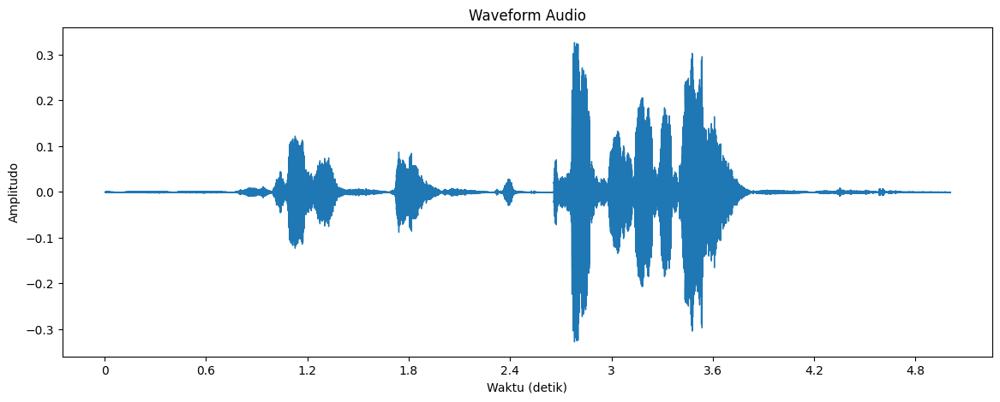

In [153]:
audio_path6 = '03-01-06-02-01-01-01.wav' #Takut
y, sr = librosa.load(audio_path6)
ipd.display(ipd.Audio(y, rate=sr))

plt.figure(figsize=(14, 5))
librosa.display.waveshow(y, sr=sr)
plt.title('Waveform Audio')
plt.xlabel('Waktu (detik)')
plt.ylabel('Amplitudo')
plt.show()

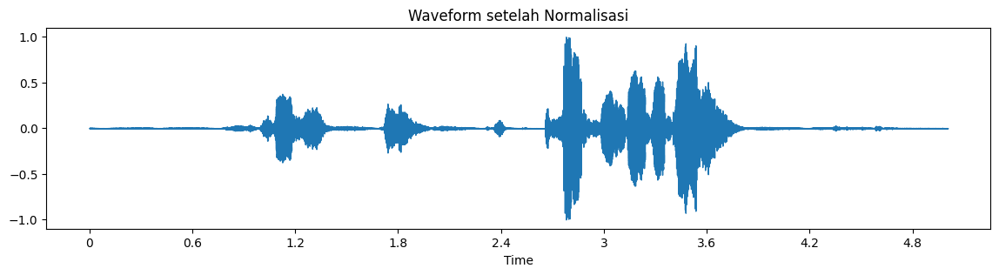

In [154]:
y_norm = y / np.max(np.abs(y)) # Biar amplitudonya konsisten
ipd.display(ipd.Audio(y_norm, rate=sr))

plt.figure(figsize=(14, 3))
librosa.display.waveshow(y_norm, sr=sr)
plt.title('Waveform setelah Normalisasi')
plt.show()

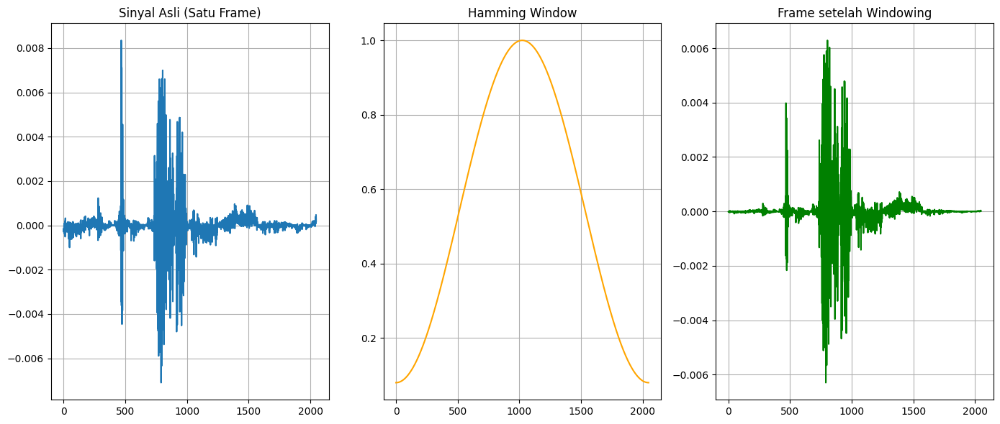

In [155]:
frame_size = 2048
hop_length = 512

center_sample = len(y_norm) // 2
frame = y_norm[center_sample : center_sample + frame_size]
window = np.hamming(frame_size)

frame_windowed = frame * window
frame_looped = np.tile(frame_windowed, 50)
ipd.display(ipd.Audio(frame_looped, rate=sr))

plt.figure(figsize=(14, 6))
plt.subplot(1, 3, 1)
plt.plot(frame)
plt.title('Sinyal Asli (Satu Frame)')
plt.grid()

plt.subplot(1, 3, 2)
plt.plot(window, color='orange')
plt.title('Hamming Window')
plt.grid()

plt.subplot(1, 3, 3)
plt.plot(frame_windowed, color='green')
plt.title('Frame setelah Windowing')
plt.grid()
plt.tight_layout()
plt.show()

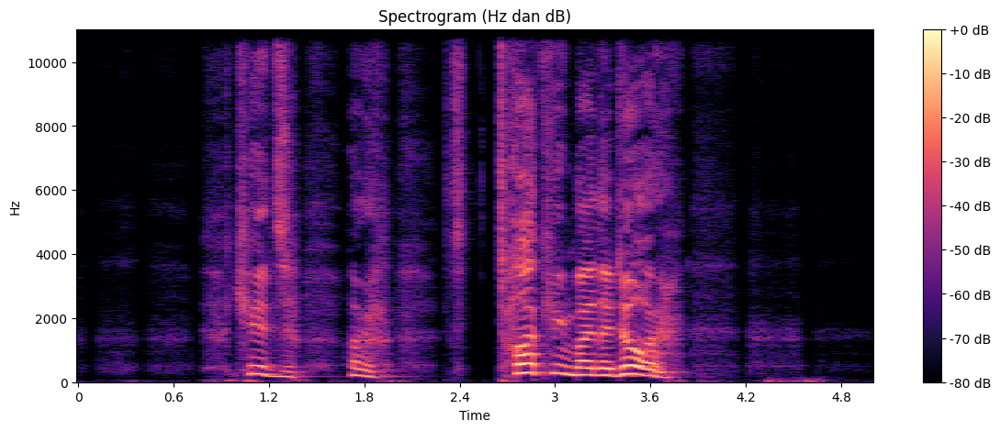

In [156]:
D = librosa.stft(y_norm)
S_db = librosa.amplitude_to_db(np.abs(D), ref=np.max)

plt.figure(figsize=(14, 5))
librosa.display.specshow(S_db, sr=sr, x_axis='time', y_axis='hz')
plt.colorbar(format='%+2.0f dB')
plt.title('Spectrogram (Hz dan dB)')
plt.show()

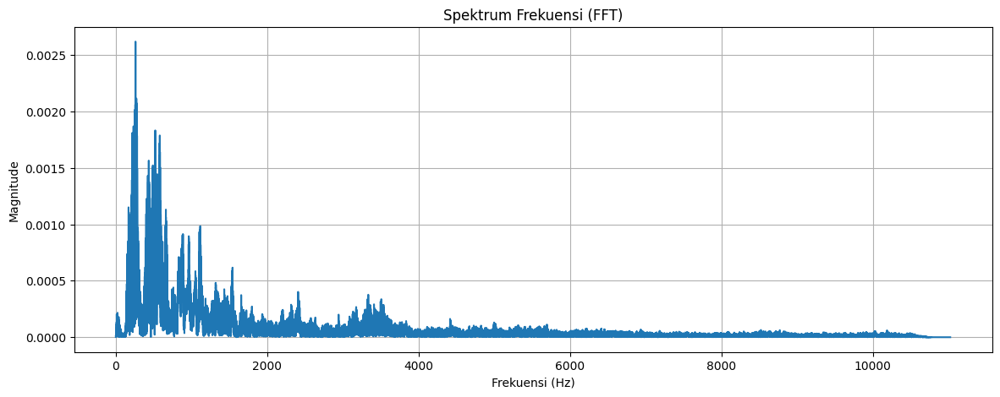

In [157]:
from scipy.fft import fft, fftfreq
N = len(y)
yf = fft(y)
xf = fftfreq(N, 1 / sr)

plt.figure(figsize=(14, 5))
plt.plot(xf[:N//2], 2.0/N * np.abs(yf[:N//2]))
plt.title('Spektrum Frekuensi (FFT)')
plt.xlabel('Frekuensi (Hz)')
plt.ylabel('Magnitude')
plt.grid()
plt.show()

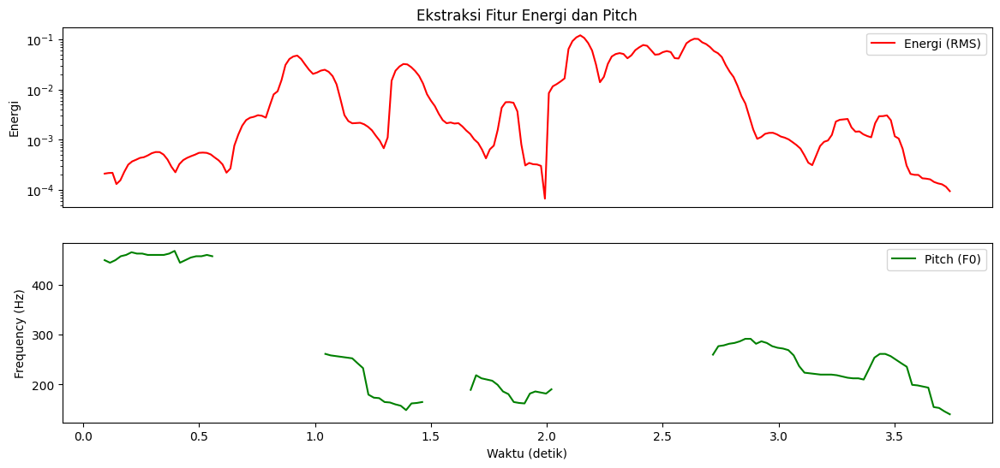

Rata-rata Pitch: 268.76 Hz
Rata-rata Energi: 0.0164


In [158]:
f0, voiced_flag, voiced_probs = librosa.pyin(y, fmin=librosa.note_to_hz('C2'), fmax=librosa.note_to_hz('C7'))
rms = librosa.feature.rms(y=y)
times = librosa.times_like(rms)

plt.figure(figsize=(14, 6))

plt.subplot(2, 1, 1)
plt.semilogy(times, rms[0], label='Energi (RMS)', color='r')
plt.ylabel('Energi')
plt.xticks([])
plt.legend()
plt.title('Ekstraksi Fitur Energi dan Pitch')

plt.subplot(2, 1, 2)
plt.plot(times, f0, label='Pitch (F0)', color='g')
plt.ylabel('Frequency (Hz)')
plt.xlabel('Waktu (detik)')
plt.legend()
plt.show()

print(f"Rata-rata Pitch: {np.nanmean(f0):.2f} Hz")
print(f"Rata-rata Energi: {np.mean(rms):.4f}")

# Jijik

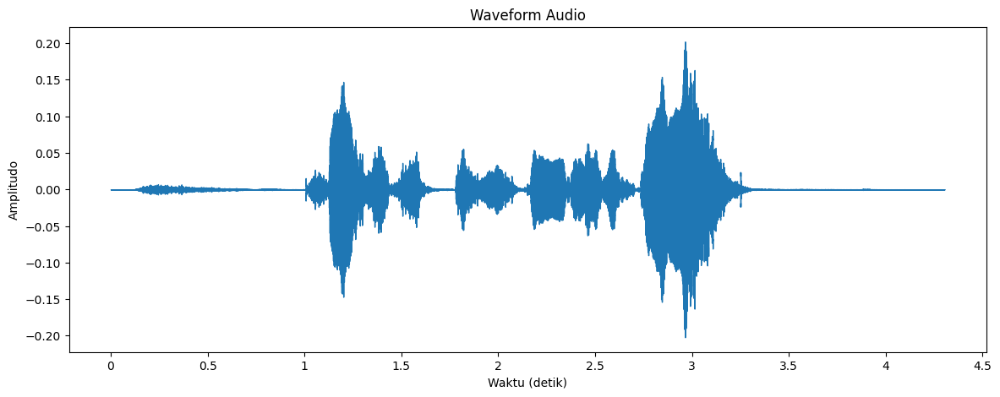

In [159]:
audio_path7 = '03-01-07-02-01-01-01.wav' #Jijik
y, sr = librosa.load(audio_path7)
ipd.display(ipd.Audio(y, rate=sr))

plt.figure(figsize=(14, 5))
librosa.display.waveshow(y, sr=sr)
plt.title('Waveform Audio')
plt.xlabel('Waktu (detik)')
plt.ylabel('Amplitudo')
plt.show()

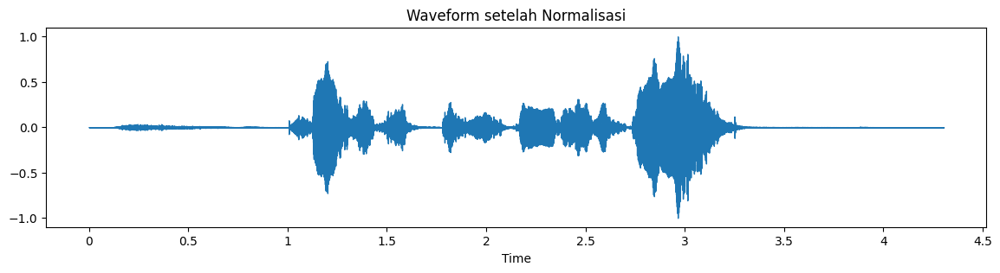

In [160]:
y_norm = y / np.max(np.abs(y)) # Biar amplitudonya konsisten
ipd.display(ipd.Audio(y_norm, rate=sr))

plt.figure(figsize=(14, 3))
librosa.display.waveshow(y_norm, sr=sr)
plt.title('Waveform setelah Normalisasi')
plt.show()

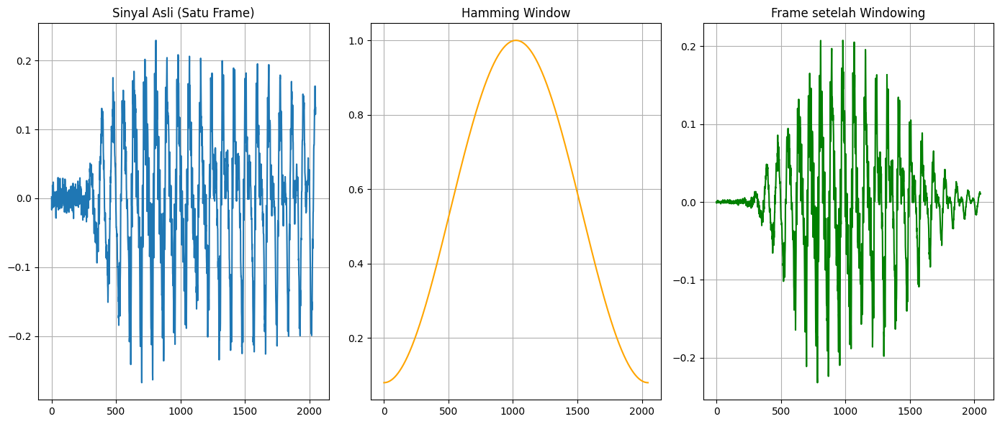

In [161]:
frame_size = 2048
hop_length = 512

center_sample = len(y_norm) // 2
frame = y_norm[center_sample : center_sample + frame_size]
window = np.hamming(frame_size)

frame_windowed = frame * window
frame_looped = np.tile(frame_windowed, 50)
ipd.display(ipd.Audio(frame_looped, rate=sr))

plt.figure(figsize=(14, 6))
plt.subplot(1, 3, 1)
plt.plot(frame)
plt.title('Sinyal Asli (Satu Frame)')
plt.grid()

plt.subplot(1, 3, 2)
plt.plot(window, color='orange')
plt.title('Hamming Window')
plt.grid()

plt.subplot(1, 3, 3)
plt.plot(frame_windowed, color='green')
plt.title('Frame setelah Windowing')
plt.grid()
plt.tight_layout()
plt.show()

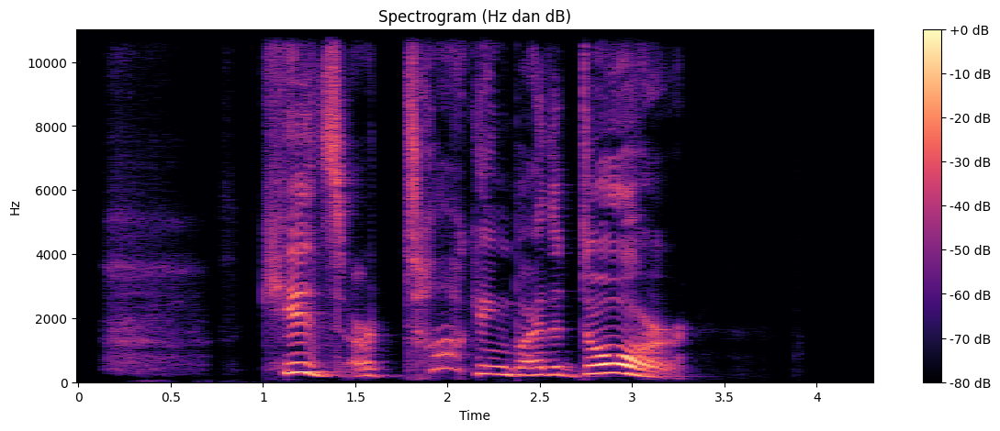

In [162]:
D = librosa.stft(y_norm)
S_db = librosa.amplitude_to_db(np.abs(D), ref=np.max)

plt.figure(figsize=(14, 5))
librosa.display.specshow(S_db, sr=sr, x_axis='time', y_axis='hz')
plt.colorbar(format='%+2.0f dB')
plt.title('Spectrogram (Hz dan dB)')
plt.show()

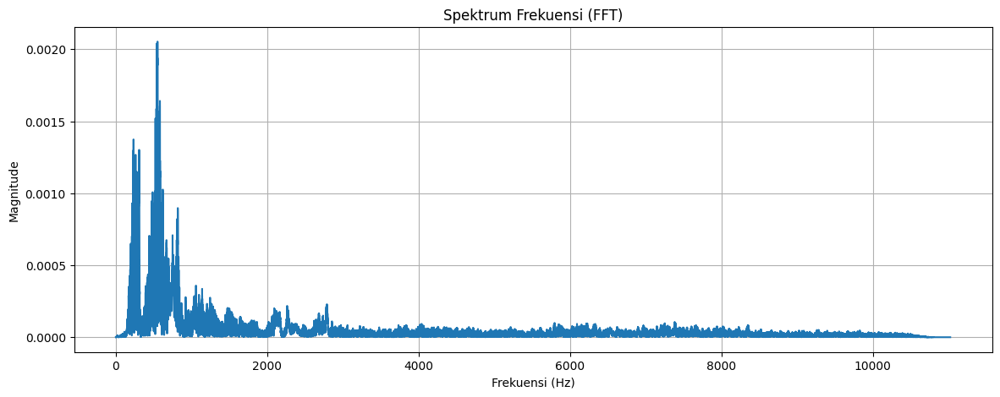

In [163]:
from scipy.fft import fft, fftfreq
N = len(y)
yf = fft(y)
xf = fftfreq(N, 1 / sr)

plt.figure(figsize=(14, 5))
plt.plot(xf[:N//2], 2.0/N * np.abs(yf[:N//2]))
plt.title('Spektrum Frekuensi (FFT)')
plt.xlabel('Frekuensi (Hz)')
plt.ylabel('Magnitude')
plt.grid()
plt.show()

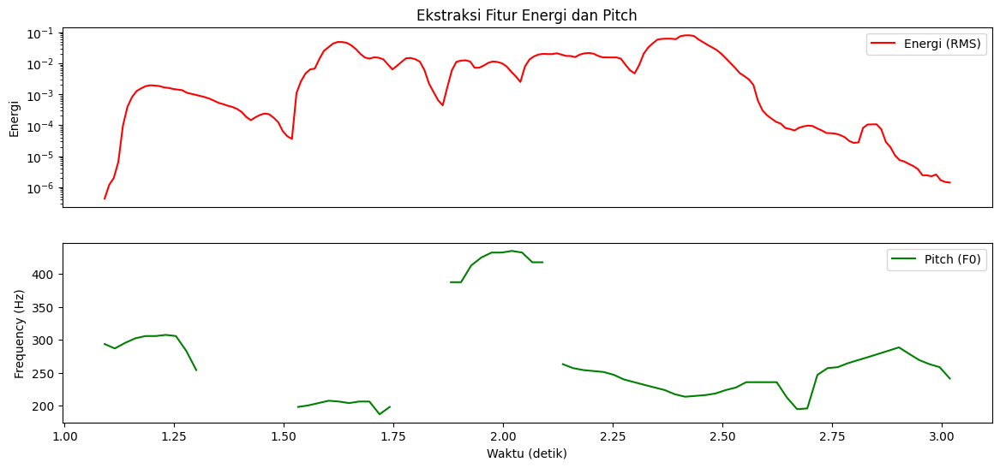

Rata-rata Pitch: 270.11 Hz
Rata-rata Energi: 0.0113


In [164]:
f0, voiced_flag, voiced_probs = librosa.pyin(y, fmin=librosa.note_to_hz('C2'), fmax=librosa.note_to_hz('C7'))
rms = librosa.feature.rms(y=y)
times = librosa.times_like(rms)

plt.figure(figsize=(14, 6))

plt.subplot(2, 1, 1)
plt.semilogy(times, rms[0], label='Energi (RMS)', color='r')
plt.ylabel('Energi')
plt.xticks([])
plt.legend()
plt.title('Ekstraksi Fitur Energi dan Pitch')

plt.subplot(2, 1, 2)
plt.plot(times, f0, label='Pitch (F0)', color='g')
plt.ylabel('Frequency (Hz)')
plt.xlabel('Waktu (detik)')
plt.legend()
plt.show()

print(f"Rata-rata Pitch: {np.nanmean(f0):.2f} Hz")
print(f"Rata-rata Energi: {np.mean(rms):.4f}")

# Kaget

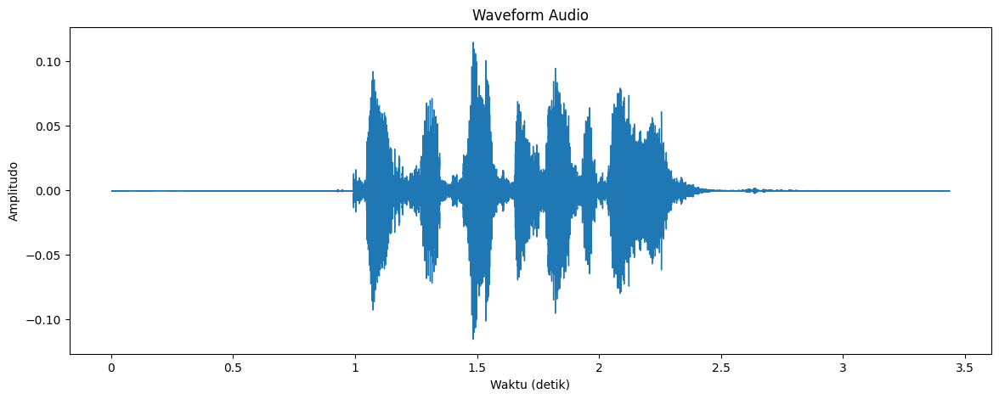

In [165]:
audio_path8 = '03-01-08-02-01-01-01.wav' #Kaget
y, sr = librosa.load(audio_path8)
ipd.display(ipd.Audio(y, rate=sr))

plt.figure(figsize=(14, 5))
librosa.display.waveshow(y, sr=sr)
plt.title('Waveform Audio')
plt.xlabel('Waktu (detik)')
plt.ylabel('Amplitudo')
plt.show()

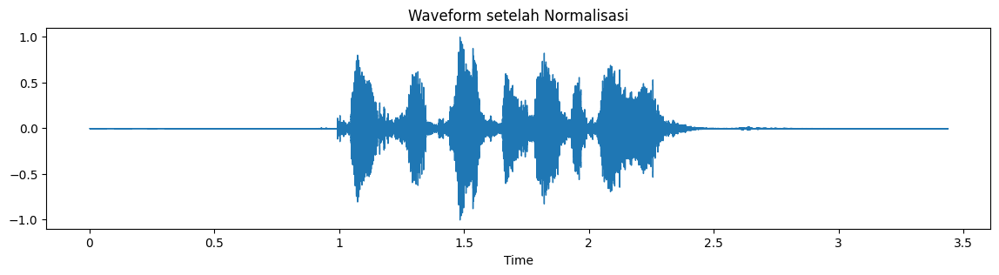

In [166]:
y_norm = y / np.max(np.abs(y)) # Biar amplitudonya konsisten
ipd.display(ipd.Audio(y_norm, rate=sr))

plt.figure(figsize=(14, 3))
librosa.display.waveshow(y_norm, sr=sr)
plt.title('Waveform setelah Normalisasi')
plt.show()

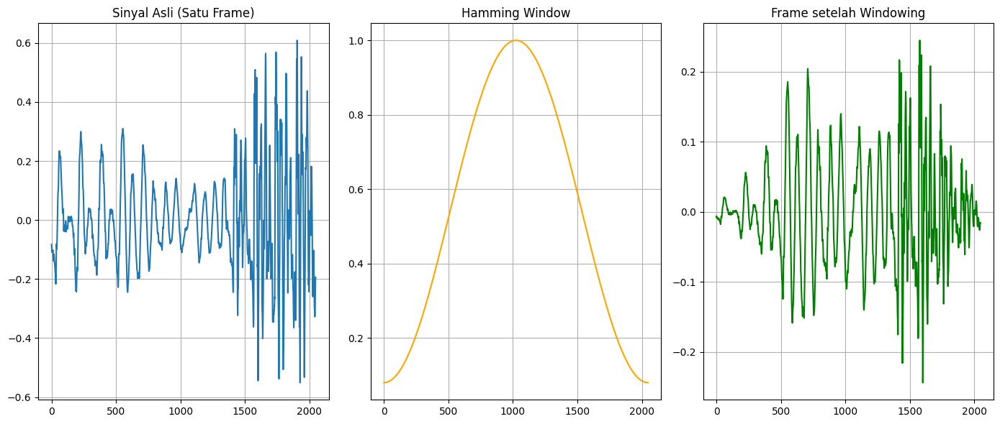

In [167]:
frame_size = 2048
hop_length = 512

center_sample = len(y_norm) // 2
frame = y_norm[center_sample : center_sample + frame_size]
window = np.hamming(frame_size)

frame_windowed = frame * window
frame_looped = np.tile(frame_windowed, 50)
ipd.display(ipd.Audio(frame_looped, rate=sr))

plt.figure(figsize=(14, 6))
plt.subplot(1, 3, 1)
plt.plot(frame)
plt.title('Sinyal Asli (Satu Frame)')
plt.grid()

plt.subplot(1, 3, 2)
plt.plot(window, color='orange')
plt.title('Hamming Window')
plt.grid()

plt.subplot(1, 3, 3)
plt.plot(frame_windowed, color='green')
plt.title('Frame setelah Windowing')
plt.grid()
plt.tight_layout()
plt.show()

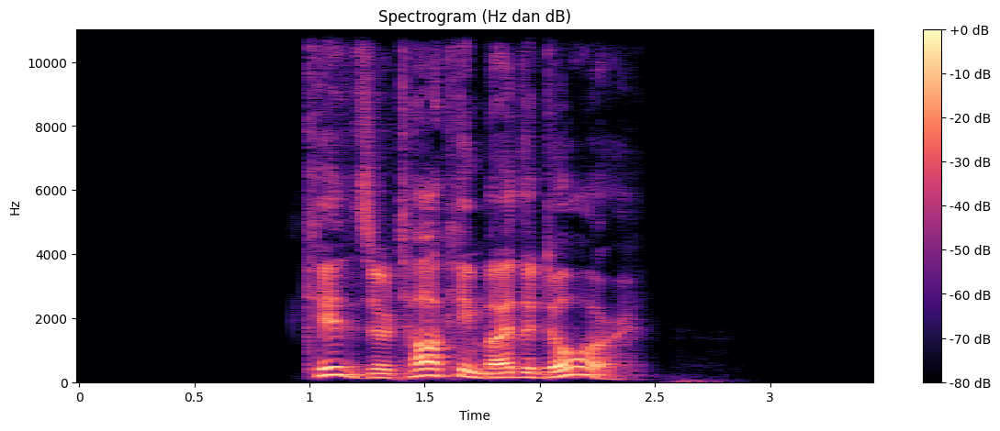

In [168]:
D = librosa.stft(y_norm)
S_db = librosa.amplitude_to_db(np.abs(D), ref=np.max)

plt.figure(figsize=(14, 5))
librosa.display.specshow(S_db, sr=sr, x_axis='time', y_axis='hz')
plt.colorbar(format='%+2.0f dB')
plt.title('Spectrogram (Hz dan dB)')
plt.show()

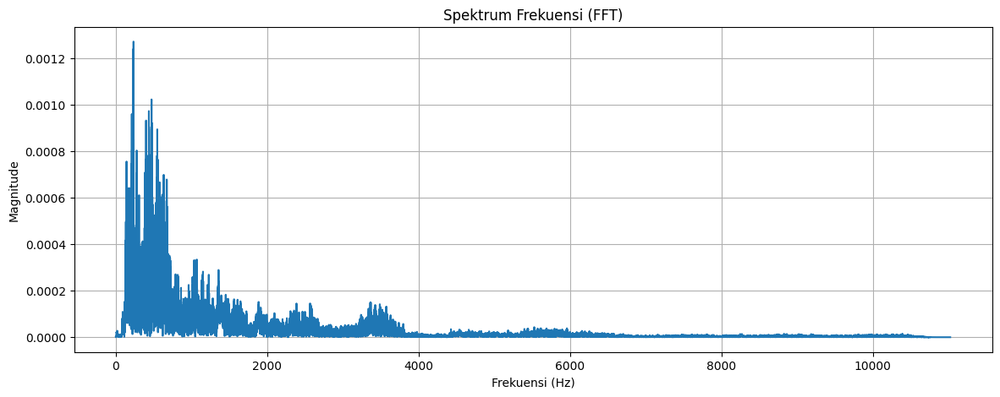

In [169]:
from scipy.fft import fft, fftfreq
N = len(y)
yf = fft(y)
xf = fftfreq(N, 1 / sr)

plt.figure(figsize=(14, 5))
plt.plot(xf[:N//2], 2.0/N * np.abs(yf[:N//2]))
plt.title('Spektrum Frekuensi (FFT)')
plt.xlabel('Frekuensi (Hz)')
plt.ylabel('Magnitude')
plt.grid()
plt.show()

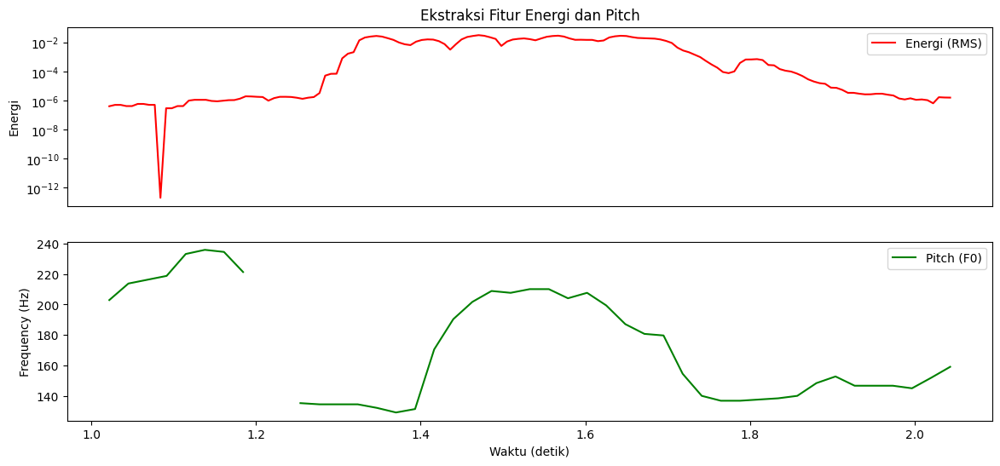

Rata-rata Pitch: 173.27 Hz
Rata-rata Energi: 0.0071


In [170]:
f0, voiced_flag, voiced_probs = librosa.pyin(y, fmin=librosa.note_to_hz('C2'), fmax=librosa.note_to_hz('C7'))
rms = librosa.feature.rms(y=y)
times = librosa.times_like(rms)

plt.figure(figsize=(14, 6))

plt.subplot(2, 1, 1)
plt.semilogy(times, rms[0], label='Energi (RMS)', color='r')
plt.ylabel('Energi')
plt.xticks([])
plt.legend()
plt.title('Ekstraksi Fitur Energi dan Pitch')

plt.subplot(2, 1, 2)
plt.plot(times, f0, label='Pitch (F0)', color='g')
plt.ylabel('Frequency (Hz)')
plt.xlabel('Waktu (detik)')
plt.legend()
plt.show()

print(f"Rata-rata Pitch: {np.nanmean(f0):.2f} Hz")
print(f"Rata-rata Energi: {np.mean(rms):.4f}")

# Ekstrasi Fitur

In [171]:
audio_folder = 'Audio'
audio_files = [os.path.join(audio_folder, f) for f in os.listdir(audio_folder) if f.endswith('.wav')]

print(f"Total {len(audio_files)} file ditemukan.")
print("Contoh 3 file pertama:", audio_files[:3])

Total 192 file ditemukan.
Contoh 3 file pertama: ['Audio/03-01-07-02-02-01-01.wav', 'Audio/03-01-06-02-02-02-03.wav', 'Audio/03-01-05-02-01-02-05.wav']


In [172]:
def extract_features(file_path):
      y, sr = librosa.load(file_path, sr=None)
      y_norm = y / np.max(np.abs(y))
      rms = librosa.feature.rms(y=y_norm)[0]
      f0, voiced_flag, voiced_probs = librosa.pyin(
          y_norm,
          fmin=librosa.note_to_hz('C2'),
          fmax=librosa.note_to_hz('C7'),
          sr=sr
      )
      mfccs = librosa.feature.mfcc(y=y_norm, sr=sr, n_mfcc=40)
      avg_pitch = np.nanmean(f0) if np.any(np.isfinite(f0)) else 0.0
      avg_mfccs = np.mean(mfccs.T, axis=0)
      features = np.hstack([
          avg_mfccs,
          np.mean(rms),
          avg_pitch
      ])

      return features

In [173]:
X_features = []
y_labels = []
for file_path in audio_files:
    features = extract_features(file_path)
    if features is not None:
        X_features.append(features)
        file_name = os.path.basename(file_path)
        emotion_code = file_name.split('-')[2]
        emotion_map = {
            '01': 'Normal', '02': 'Santai', '03': 'Senang', '04': 'Sedih',
            '05': 'Marah', '06': 'Takut', '07': 'Jijik', '08': 'Kaget'}
        emotion_label = emotion_map.get(emotion_code, 'Unknown')
        y_labels.append(emotion_label)
X = np.array(X_features)
y = np.array(y_labels)

df_features = pd.DataFrame(X)
df_features['Emotion'] = y
print(f"Shape Fitur (X): {X.shape}")
print(f"Shape Label (y): {y.shape}")
df_features

Shape Fitur (X): (192, 42)
Shape Label (y): (192,)


,0,1,2,3,4,5,6,7,8,9,...,33,34,35,36,37,38,39,40,41,Emotion
0,-382.448700,59.821617,3.986470,18.777027,-10.736347,5.534568,-5.526396,0.865793,-15.845590,-6.647062,...,1.757497,0.734360,-0.067697,0.308001,-0.069500,-1.276663,-1.647008,0.060362,202.641811,Jijik
1,-324.391266,82.685471,-25.854328,5.158638,-13.674617,6.140756,-7.603785,-3.954926,-20.229721,-5.529837,...,7.309889,5.649927,5.244015,4.544958,4.687900,3.706653,3.999917,0.065972,272.647524,Takut
2,-403.915710,57.006424,-11.755600,7.276813,-2.541634,7.929677,-12.702968,-2.009066,-6.871614,0.374614,...,2.325937,2.448191,2.293116,2.191094,3.089155,1.787573,2.041139,0.051019,868.791044,Marah
3,-424.082672,68.959435,-4.962604,5.423139,0.609843,3.160730,-9.528842,2.647468,-9.230494,-3.492379,...,-1.152899,0.626240,1.409347,-0.142977,0.227505,1.860400,1.377169,0.043356,236.729459,Normal
4,-401.077423,32.319195,-18.824198,-0.799794,-14.787984,-2.805205,-15.612923,-2.163132,-11.931265,-9.572285,...,0.978975,-0.030184,-1.366215,-2.071028,-0.014856,1.172449,0.588213,0.054105,396.414496,Takut
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
187,-355.297394,75.795700,-5.742664,11.326399,1.071849,10.995790,-2.899962,-0.772906,-10.083306,-5.325581,...,-0.343253,0.325524,0.296514,1.801231,2.496997,1.417311,2.142876,0.074446,200.564436,Sedih
188,-395.799133,43.546589,-10.552707,7.841510,-4.056153,0.199318,-9.377733,0.293508,-8.576916,-9.400686,...,2.577782,1.269640,1.025718,-0.131040,0.298788,-0.776643,-0.002037,0.055362,278.481050,Jijik
189,-320.483337,80.770599,-12.636459,7.535831,-5.420090,1.683077,-10.523615,0.158075,-18.250380,-10.055661,...,1.836596,3.507548,4.404821,3.768801,4.283252,2.783417,6.074473,0.087315,233.676677,Santai
190,-415.401581,72.971001,-6.905820,4.645147,0.412864,8.772310,-4.154121,-3.527297,-8.415510,-5.538170,...,-0.673931,0.555026,-2.313093,-2.036821,-0.473996,0.713925,0.755654,0.046644,188.136967,Senang


# Modeling

In [174]:
class_counts = df_features['Emotion'].value_counts()
single_sample_classes = class_counts[class_counts < 2].index.tolist()
print(class_counts)

Emotion
Jijik     24
Takut     24
Marah     24
Normal    24
Kaget     24
Sedih     24
Santai    24
Senang    24
Name: count, dtype: int64


In [175]:
df_filtered = df_features[~df_features['Emotion'].isin(single_sample_classes)]
X_model = df_filtered.iloc[:, :-1].values
X_model = df_filtered.drop(columns=['Emotion']).values
y_model = df_filtered['Emotion'].values

X_train, X_test, y_train, y_test = train_test_split(X_model, y_model, test_size=0.20, random_state=42, stratify=y_model)

In [176]:
scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train)
X_test_scaled = scaler.transform(X_test)

In [182]:
mlp = MLPClassifier(
    hidden_layer_sizes=(128, 64),
    max_iter=500,
    activation='relu',
    solver='adam',
    random_state=42)
mlp.fit(X_train_scaled, y_train)

MLPClassifier(hidden_layer_sizes=(128, 64), max_iter=500, random_state=42)

In [183]:
y_pred = mlp.predict(X_test_scaled)
accuracy = accuracy_score(y_test, y_pred)
print(f"Akurasi Model MLP: {accuracy * 100:.2f}%")
print(classification_report(y_test, y_pred, zero_division=0))

Akurasi Model MLP: 79.49%
              precision    recall  f1-score   support

       Jijik       0.67      0.80      0.73         5
       Kaget       1.00      0.50      0.67         4
       Marah       0.83      1.00      0.91         5
      Normal       0.83      1.00      0.91         5
      Santai       0.60      0.60      0.60         5
       Sedih       0.80      0.80      0.80         5
      Senang       1.00      0.80      0.89         5
       Takut       0.80      0.80      0.80         5

    accuracy                           0.79        39
   macro avg       0.82      0.79      0.79        39
weighted avg       0.81      0.79      0.79        39



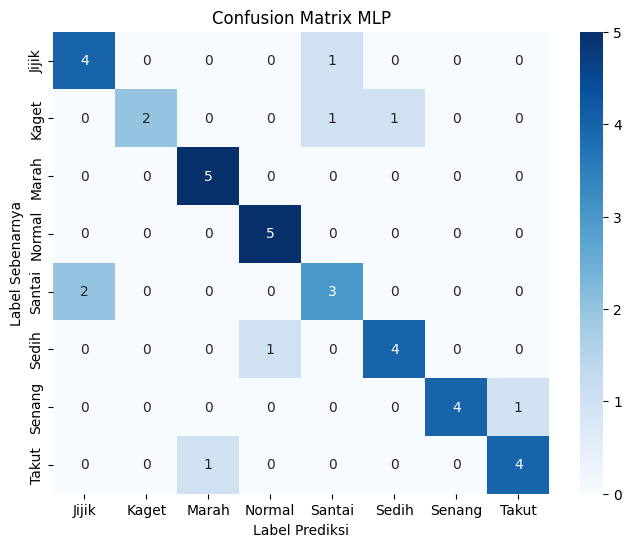

In [179]:
cm = confusion_matrix(y_test, y_pred)
plt.figure(figsize=(8, 6))
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues',
            xticklabels=np.unique(y_model),
            yticklabels=np.unique(y_model))
plt.title('Confusion Matrix MLP')
plt.ylabel('Label Sebenarnya')
plt.xlabel('Label Prediksi')
plt.show()